House Price Index Prediction - Support Vector Machine, K Nearest Neighbor Classifier

In [91]:
import quandl
import pandas as pd
import numpy as np
import pickle
import matplotlib.pyplot as plt
from matplotlib import style
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objs as go
import cufflinks as cf
import seaborn as sns
init_notebook_mode(connected = True)
cf.go_offline()
from sklearn.cross_validation import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier 
from sklearn.metrics import classification_report, confusion_matrix
from sklearn import svm,preprocessing,cross_validation

Setting Up The Quandl Authorization Key and accessing a sample Data Set

In [2]:
quandalauthorization_key = open('quandlapikey.txt','r').read()
df= quandl.get("FMAC/HPI_AK", authtoken = quandalauthorization_key)

Get the abbrebiations of all the States In America from Wikipedia

In [41]:
def listofstates():
    fifty_states_list = pd.read_html('https://simple.wikipedia.org/wiki/List_of_U.S._states')
    return fifty_states_list[0][1][1:]


Write The data of the Dataframe into pickle, Pickle is sort of a cache memory and helps reduce the data fetch time, It stores data in the memory and everytime we donot need to hit external websited to fetch the data back

In [83]:
def get_HPI_of_all_states():
    primary_dataframe = pd.DataFrame()
    allStateList = listofstates()
    for state in allStateList:
        quandlCode = "FMAC/HPI_"+str(state)
        getQuandalHpiData = quandl.get(quandlCode, authtoken = quandalauthorization_key)
        getQuandalHpiData.rename(columns = {'Value': state}, inplace = True)
        if primary_dataframe.empty:
            primary_dataframe = getQuandalHpiData         
        else:
            primary_dataframe = primary_dataframe.join(getQuandalHpiData)
        primary_dataframe.to_pickle('ListOfAllStates.pickle')
get_HPI_of_all_states() 

Comparison of House Price index between different states in 2017

In [86]:
HPI_states = pd.read_pickle('ListOfAllStates.pickle') 
HPI_data_states_2017 = HPI_states[-12:].resample('A').mean()
mean_value = pd.Series(HPI_data_states_2017.values[0], index=HPI_data_states_2017.columns)

data =dict(type = 'choropleth', locations = mean_value.index, locationmode = 'USA-states', colorscale = 'Portland', 
          text =['text1','text2,''text3'], z= mean_value, colorbar ={'title' :'Color Bar title goes here'})
layout = dict(geo = dict(scope = 'usa'), title = 'USA map with HPI for all the States in 2017')

choromap = go.Figure(data=[data] , layout = layout)
iplot(choromap)

Data visualization of the House Price Index data for all the states from 1975 to present

In [6]:
HPI_states.iplot(xTitle = 'Year', yTitle = 'HPI', title = 'HPI Vs Year for all the States')

Draw the above graph by skipping hover info to understand the minor differences by zooming into the graph

In [7]:
HPI_states.iplot(hoverinfo = 'skip',xTitle = 'Year', yTitle = 'HPI', title = 'HPI Vs Year for all the States')

Run This Part if you want to see a Percentage change in the Data rather than all the exact plotting , only one line has been added "getQuandalHpiData = getQuandalHpiData.pct_change"

In [8]:
def get_HPI_of_all_states_pct():
    primary_dataframe = pd.DataFrame()
    allStateList = listofstates()
    for state in allStateList:
        quandlCode = "FMAC/HPI_"+str(state)
        getQuandalHpiData = quandl.get(quandlCode, authtoken = quandalauthorization_key)
        getQuandalHpiData.rename(columns = {'Value': state}, inplace = True)
        getQuandalHpiData[state] = (getQuandalHpiData[state] - getQuandalHpiData[state][0]) / getQuandalHpiData[state][0] * 100
        if primary_dataframe.empty:
            primary_dataframe = getQuandalHpiData 
        else:
            primary_dataframe = primary_dataframe.join(getQuandalHpiData)
        primary_dataframe.to_pickle('ListOfAllStatesPct.pickle')
get_HPI_of_all_states_pct()    

Data visualization to find the percentage changes in the House Prices compared to the prices in 1975

In [9]:
HPI_data_pct = pd.read_pickle('ListOfAllStatesPct.pickle') 
HPI_data_pct.iplot(xTitle = 'Year', yTitle = 'Percentage changes', title = 'Percentage changes in the House Prices Indexes')

Fetching the Details of the Housing Price Index transition of the country United States of America 

In [95]:
def HPI_USA():
    HPI_USA = quandl.get("FMAC/HPI_USA", authtoken = quandalauthorization_key)
    HPI_USA['Value'] = (HPI_USA['Value'] - HPI_USA['Value'][0]) / HPI_USA['Value'][0] * 100
    return HPI_USA

Plot the House Price Index deviation across all the states and the house price index deviation across USA as a country together

In [14]:
HPI_states_pct = pd.read_pickle('ListOfAllStatesPct.pickle') 
USA_HPI = pd.DataFrame()
USA_HPI = HPI_USA()
data = []
for value in HPI_states_pct:
    trace = go.Scatter(x = HPI_states_pct.index, y = list(HPI_states_pct[value]), name = str(value))
    data.append(trace)
    
trace2 = go.Scatter(x = USA_HPI.index, y = USA_HPI.Value, name = 'USA',line = dict(width = 8, color ='black'))
data.append(trace2)
layout = dict(title = 'Comparison of USA percentage change')
fig = dict(data = data, layout = layout)
iplot(fig)


Find the Correlation of the data amongst the states

In [96]:
HPI_for_states_correlation = HPI_states_pct.corr()
display(HPI_for_states_correlation.describe())
trace = go.Heatmap(x = HPI_for_states_correlation.index, y =HPI_for_states_correlation.columns, z= HPI_for_states_correlation.values, 
                  colorscale='Viridis')
data = [trace]
layout = dict(title = 'Correlation between the states')
fig = dict(data = data, layout = layout)
iplot(fig)
#sns.heatmap(HPI_state_correlation)

,AL,AK,AZ,AR,CA,CO,CT,DE,FL,GA,...,TN,TX,UT,VT,VA,WA,WV,WI,WY,CASTD
count,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,...,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000
mean,0.963812,0.936780,0.932451,0.965674,0.943947,0.944055,0.922094,0.956591,0.929795,0.950612,...,0.964107,0.925441,0.951187,0.957663,0.961787,0.960173,0.958489,0.959857,0.936837,0.658632
std,0.050730,0.061235,0.044247,0.051796,0.043681,0.056320,0.051906,0.047241,0.045325,0.047379,...,0.053598,0.064281,0.056805,0.050532,0.047289,0.050528,0.055075,0.047585,0.059871,0.060551
min,0.654832,0.607143,0.677354,0.647593,0.679846,0.610633,0.695600,0.692139,0.680530,0.666624,...,0.631321,0.572475,0.616856,0.668323,0.679816,0.645870,0.637231,0.675546,0.631723,0.549940
25%,0.953754,0.929408,0.923539,0.964267,0.937390,0.932247,0.897474,0.949738,0.918276,0.946676,...,0.959994,0.912879,0.943118,0.955144,0.960874,0.958597,0.954012,0.952104,0.926414,0.627855
50%,0.977369,0.951615,0.939341,0.978916,0.947571,0.957207,0.929113,0.965842,0.933325,0.958628,...,0.976720,0.937026,0.965167,0.970892,0.973429,0.972113,0.974658,0.970380,0.954295,0.650471
75%,0.985735,0.964617,0.947784,0.988917,0.963311,0.971608,0.956632,0.980168,0.951643,0.972861,...,0.987833,0.960452,0.980700,0.980431,0.979182,0.979009,0.983731,0.984753,0.966651,0.680188
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Selecting one of the states , and resampling the data to annual from the current monthly, and plotting it to show how the monthly data varies along with the yearly data
 
Analysis
 . Yearly data is always a lagging indicator, as it is prepared after the completion of the year
 . The House prices increases aroound June and Decreases around December 

In [93]:
HPI_for_state_annually = HPI_states_pct['TX'].resample('A').mean()
trace1 = go.Scatter(x = HPI_states_pct['TX'].index, y = HPI_states_pct['TX'].values, name = 'Monthly HPI')  
trace2 = go.Scatter(x = HPI_for_state_annually.index, y = HPI_for_state_annually.values, name = 'Yearly HPI')
data = [trace1, trace2]
layout = dict(title = 'Monthly and Yearly HPI')
fig = dict(data = data, layout = layout)
iplot(fig)


Standar Deviation - The below Section helps represent standard deviation and the deviation of HPI over the years for a particular state. Standard Deviation is important as it helps find out the volatility in the market, Identify outliers. Things with greater standard deviation means that there is lot of instability in the market

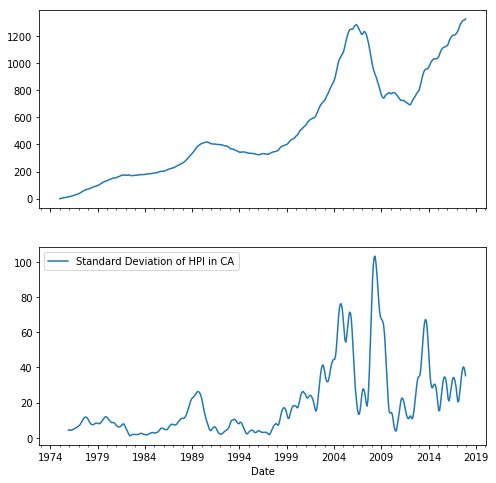

In [17]:
fig,axes = plt.subplots(figsize = (8,8))
ax1 = plt.subplot2grid((2,1),(0,0))
ax2 = plt.subplot2grid((2,1),(1,0), sharex = ax1)
HPI_states_pct['CASTD'] =  HPI_states_pct['CA'].rolling(12).std()
HPI_states_pct['CA'].plot(ax = ax1, label = 'Monthyl HPI OF CA')
HPI_states_pct['CASTD'].plot(ax = ax2, label = 'Standard Deviation of HPI in CA')
plt.legend(loc = 2)

Rolling Correlation - This helps find the correlation between the HPI prices deviation between two states and helps us to realize how the HPI of two states eventually conincide and how can an individual use this to make smart investment decisions.

Conclusion 
Every time correlation drops, we should in theory sell property in the area that is rising, and then we should buy property in the area that is falling. The idea is that, these two areas are so highly correlated that we can be very confident that the correlation will eventually return back to 1 and giving us an oppurtunity to make money

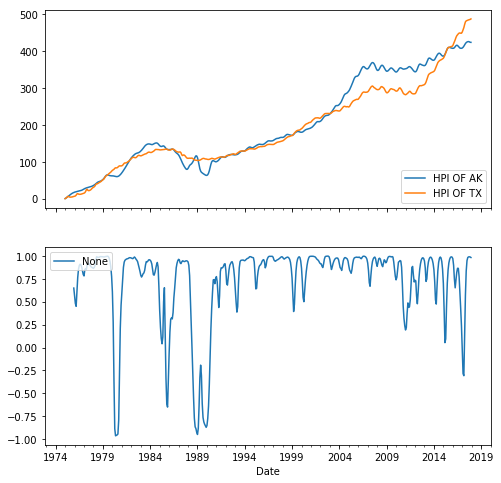

In [18]:
fig,axes = plt.subplots(figsize = (8,8))
ax1 = plt.subplot2grid((2,1),(0,0))
ax2 = plt.subplot2grid((2,1),(1,0), sharex = ax1)
HPI_CORR = HPI_states_pct['TX'].rolling(12).corr(HPI_states_pct['AK'],pairwise = True)

HPI_CORR.plot(ax = ax2)
HPI_states_pct['AK'].plot(ax = ax1, label = 'HPI OF AK')
HPI_states_pct['TX'].plot(ax = ax1, label = 'HPI OF TX')

ax1.legend(loc = 4)
plt.legend(loc = 2)

Get the 30 Year Mortgage rate details from Quandl - https://www.quandl.com/data/FMAC/30US-30-Year-Fixed-Rate-Mortgage-Average-in-the-United-States

Conclusion - This data should be very negatively correlated with the House Price Index (HPI). 

In [19]:
def MORTGAGE_RATE_USA():
    MORTGAGE_RATE = quandl.get("FMAC/MORTG",trim_start = "1975-01-01", authtoken = quandalauthorization_key)
    MORTGAGE_RATE["Value"] =  (MORTGAGE_RATE["Value"] - MORTGAGE_RATE["Value"][0]) / MORTGAGE_RATE["Value"][0]  * 100
    #MORTGAGE_RATE.drop('Date', axis = 1)
    MORTGAGE_RATE = MORTGAGE_RATE.resample('1D').mean()
    MORTGAGE_RATE = MORTGAGE_RATE.resample('M').mean()
    return MORTGAGE_RATE

Include other Economic Indicators to analyze the cross impact of each one of them on the Housing price Index
Mentioned below are few key econmic Indicators
    . S&P 500 index stock market index for a Country
    . Gross Domestic Product of a Country
    . Unemployment Rate

In [20]:

def gdp_of_usa():
    gdp_data  =  quandl.get("BCB/4385", trim_start="1975-01-01", authtoken=quandalauthorization_key)
    gdp_data["Value"] = (gdp_data["Value"]-gdp_data["Value"][0]) / gdp_data["Value"][0] * 100.0
    gdp_data=gdp_data.resample('M').mean()
    gdp_data.rename(columns={'Value':'GDP'}, inplace=True)
    return gdp_data



def us_unemployment():
    unemployment_data = quandl.get("AMECO/USA_1_0_0_0_ZUTN", trim_start="1975-01-01", authtoken=quandalauthorization_key)
    unemployment_data["Value"] = (unemployment_data["Value"]-unemployment_data["Value"][0]) / unemployment_data["Value"][0] * 100.0
    unemployment_data=unemployment_data.resample('1D').mean()
    unemployment_data=unemployment_data.resample('M').mean()
    return unemployment_data



In [21]:
import pandas as pd
import quandl
def sp500_index():
    sp500_index_data = pd.read_csv('GSPC.csv')
    sp500_index_data["Date"]  = pd.to_datetime(sp500_index_data["Date"])
    sp500_index_data = sp500_index_data[['Date','Adj Close']]
    sp500_index_data  = sp500_index_data.set_index('Date')
    sp500_index_data['Adj Close'] = (sp500_index_data["Adj Close"]-sp500_index_data["Adj Close"][0]) / sp500_index_data["Adj Close"][0] * 100.0
    sp500_index_data  = sp500_index_data.resample('1D').mean()
    sp500_index_data  = sp500_index_data.resample('M').mean()
    sp500_index_data.rename(columns={'Adj Close':'SP500'}, inplace=True)
    return sp500_index_data


Consolidate the features with the main Table to find the classifiers for classification

In [64]:
HPI_US = HPI_USA()
HPI_US.columns = ["USA HPI"]
MORTGAGE_RATE = MORTGAGE_RATE_USA()
MORTGAGE_RATE.columns = ['MortgageRate']
gdp_data = gdp_of_usa()
unemployment_data = us_unemployment()
unemployment_data.columns = ['Unemployment Rate']
sp500_index_data = sp500_index()
HPI_Consolidated_With_Indicators  = HPI_states_pct.join([HPI_US,MORTGAGE_RATE,unemployment_data,gdp_data,sp500_index_data]) 

Add the Label column in the dataframe

In [68]:
def create_lables(current_hpi,furutre_hpi):
    if furutre_hpi > current_hpi:
        return 1
    else:
        return 0
    
housing_data = HPI_Consolidated_With_Indicators
housing_data = housing_data.pct_change()
housing_data.replace([np.inf, -np.inf], np.nan , inplace= True)
housing_data.dropna(inplace= True)
housing_data["USA_HPI_Future"] = housing_data["USA HPI"].shift(-1)
housing_data['Label']  = list(map(create_lables,housing_data["USA HPI"],housing_data["USA_HPI_Future"]))


1. Support Vector Machine Algorithm

In [100]:
X = np.array(housing_data.drop(['Label','USA_HPI_Future'],1))
X = preprocessing.scale(X)
y = np.array(housing_data['Label'])
X_train,X_test, y_train, y_test = cross_validation.train_test_split(X,y,test_size = 0.2)
clf = svm.SVC(kernel='linear')
clf.fit(X_train,y_train)
print("Accuracy:",clf.score(X_test,y_test))

Accuracy: 0.8059701492537313


2. k Nearest Neighbor Algorithm

In [78]:
housing_data_drop = housing_data.drop(['Label','USA_HPI_Future'], axis = 1)
scaler = StandardScaler()
scaler.fit(housing_data_drop)
scaled_features = scaler.transform(housing_data_drop)
df_feat = pd.DataFrame(scaled_features, columns = housing_data_drop.columns)
X =  df_feat
y = np.array(housing_data['Label'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X_train, y_train)
pred = knn.predict(X_test)
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))

[[32  5]
 [16 14]]
             precision    recall  f1-score   support

          0       0.67      0.86      0.75        37
          1       0.74      0.47      0.57        30

avg / total       0.70      0.69      0.67        67



Find the k value with minimum error rate

Text(0,0.5,'Error Rate')

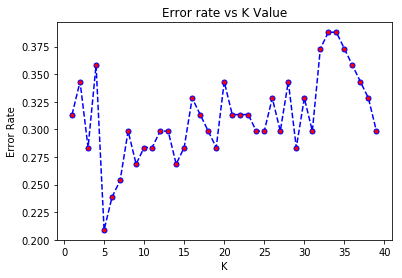

In [79]:
error_rate = []

for i in range(1,40):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train, y_train)
    pred_i = knn.predict(X_test)
    error_rate.append(np.mean(pred_i != y_test))
    
plt.Figure(figsize = (10, 6))
plt.plot(range(1,40), error_rate, color = 'blue', linestyle = 'dashed', marker = 'o', markerfacecolor = 'red', markersize = 5)
plt.title('Error rate vs K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')    

Use the k value with minimum error rate to increase the accuracy of the model

In [82]:
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)
pred = knn.predict(X_test)
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))

[[32  5]
 [ 9 21]]
             precision    recall  f1-score   support

          0       0.78      0.86      0.82        37
          1       0.81      0.70      0.75        30

avg / total       0.79      0.79      0.79        67

